In [2]:
import numpy as np
import pandas as pd
import pydub
import librosa
from IPython.display import Audio
import sklearn as sk
import matplotlib.pyplot as plt
import torch
import torchaudio

In [2]:
df = pd.read_csv('metadata.csv')
example = df[df['instrument'] == 'viola'].iloc[0]
example.head()

filename      data/train/viola_solo_train_Campagnoli Caprice...
instrument                                                viola
set                                                       train
Name: 20, dtype: object

In [5]:
AUDIO_FILE = "data/train/violin_solo_train_MOZART VIOLIN CONCERTO No. 3, A VERY FINE, ANTIQUE AMERICAN VIOLIN, SOLO SOUND SAMPLE.wav"
sample_rate = 44100  # Assuming a common sample rate
samples_original, _ = librosa.load(AUDIO_FILE, sr=sample_rate)
print(len(samples_original) // sample_rate, 'seconds')
samples = samples_original[:15 * sample_rate]

88 seconds


In [23]:
min_sample_rate = float('inf')
for filename in df['filename']:
    _, sample_rate = librosa.load(filename, sr=None)
    min_sample_rate = min(min_sample_rate, sample_rate)
print(f'Minimum sample rate across all files: {min_sample_rate}')

Minimum sample rate across all files: 44100


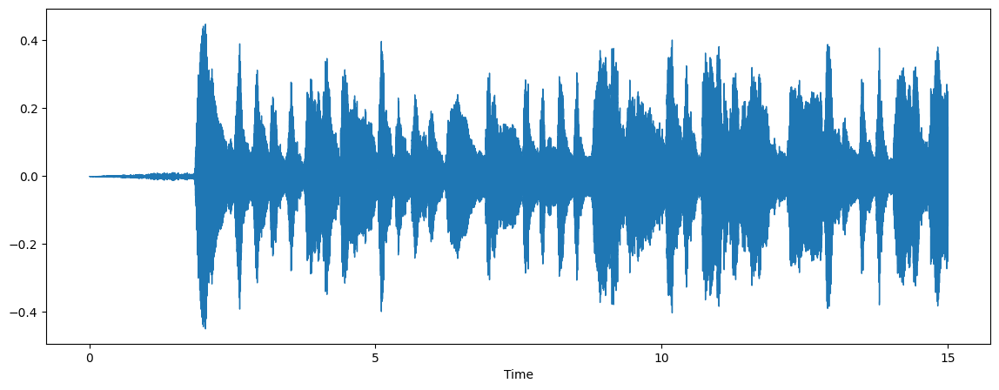

In [25]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(samples, sr=sample_rate)

In [6]:
Audio(AUDIO_FILE)

In [26]:
print ('Example shape ', samples.shape, 'Sample rate ', sample_rate, 'Data type', type(samples))
print (samples[22400:22420])

Example shape  (661500,) Sample rate  44100 Data type <class 'numpy.ndarray'>
[-0.00080872 -0.00082397 -0.00080872 -0.00082397 -0.00083923 -0.00088501
 -0.00090027 -0.00093079 -0.00097656 -0.0010376  -0.00112915 -0.00117493
 -0.0012207  -0.00125122 -0.001297   -0.001297   -0.00128174 -0.00125122
 -0.00120544 -0.00115967]


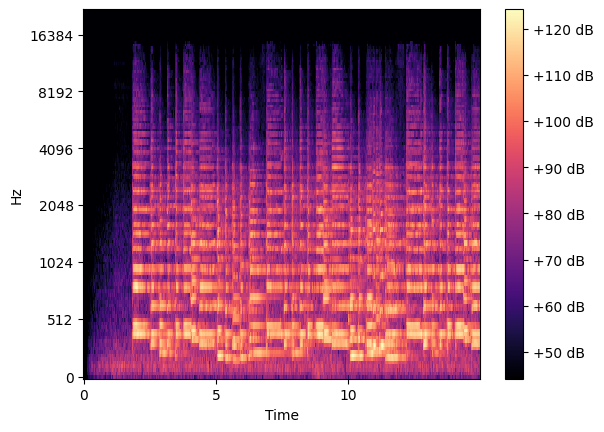

In [27]:
mel_sgram = librosa.power_to_db(
    librosa.feature.melspectrogram(y=samples, sr=sample_rate),
    ref=np.min
)# Display the mel spectrogram
librosa.display.specshow(mel_sgram, sr=sample_rate, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')

In [28]:
df = pd.read_csv('processed_data.csv')
# for _, example in df.iterrows():
#     sample_rate = 44100  # Assuming a common sample rate
#     SECONDS = 10
#     length = SECONDS * sample_rate
#     AUDIO_FILE = example['song']
#     samples, _ = librosa.load(AUDIO_FILE, sr=sample_rate)
#     chunk = samples[example['start']:example['start'] + length]
#     print(f"{example['start'] / sample_rate} {example['start'] + length / sample_rate} {len(samples) / sample_rate}")
train = df[df['set'] == 'train']
test = df[df['set'] == 'test']
print(train.instrument.value_counts())
print(test.instrument.value_counts())

instrument
violin    9919
viola     6399
Name: count, dtype: int64
instrument
violin    5343
viola     2566
Name: count, dtype: int64


In [4]:
print(len(example['chunk']))

71
